In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import glob
import os
import numpy as np

In [2]:
def visualize_stretched_by_partition(folder_path):
    topo_files = glob.glob(os.path.join(folder_path, "*_topology.csv"))
    if not topo_files:
        print("Файл топологии не найден")
        return

    G = nx.from_pandas_edgelist(pd.read_csv(topo_files[0]), 'source', 'target')
    map_files = sorted(glob.glob(os.path.join(folder_path, "*_map.csv")))

    for map_path in map_files:
        part_df = pd.read_csv(map_path)
        partition_map = dict(zip(part_df.node_id, part_df.partition_id))

        # 1. Находим все компоненты связности
        all_comp_subgraphs = []
        unique_parts = sorted(part_df.partition_id.unique())

        # СЛОВАРЬ ДЛЯ ПЕЧАТИ СТАТИСТИКИ
        partition_stats = {}

        for p_id in unique_parts:
            nodes_in_part = [n for n, p in partition_map.items() if p == p_id]
            sub_G = G.subgraph(nodes_in_part)
            components = list(nx.connected_components(sub_G))

            partition_stats[p_id] = len(components) # Сохраняем количество для печати

            for comp_nodes in components:
                all_comp_subgraphs.append(list(comp_nodes))

        # --- БЛОК ПЕЧАТИ В КОНСОЛЬ ---
        print(f"\n{'='*50}")
        print(f"FILE: {os.path.basename(map_path)}")
        print(f"{'Partition ID':<15} | {'Components Count':<15}")
        print("-" * 35)
        for p_id in sorted(partition_stats.keys()):
            print(f"{p_id:<15} | {partition_stats[p_id]:<15}")
        print(f"Total Isolated Components: {len(all_comp_subgraphs)}")
        print(f"{'='*50}")

        # 2. Двухуровневая укладка (Stretched Layout)
        pos = {}
        num_comps = len(all_comp_subgraphs)
        center_circle_radius = 5.0

        for i, comp_nodes in enumerate(all_comp_subgraphs):
            angle = 2 * np.pi * i / num_comps
            center_x = center_circle_radius * np.cos(angle)
            center_y = center_circle_radius * np.sin(angle)

            if len(comp_nodes) > 1:
                sub_G = G.subgraph(comp_nodes)
                local_pos = nx.spring_layout(sub_G, k=0.5, seed=42)
                for node, l_pos in local_pos.items():
                    pos[node] = l_pos + np.array([center_x, center_y])
            else:
                pos[comp_nodes[0]] = np.array([center_x, center_y])

        # 3. Подготовка ребер (внутренние и внешние)
        comp_id_map = {}
        for i, comp in enumerate(all_comp_subgraphs):
            for node in comp:
                comp_id_map[node] = i

        internal_edges = [(u, v) for u, v in G.edges() if comp_id_map.get(u) == comp_id_map.get(v)]
        cut_edges = [(u, v) for u, v in G.edges() if comp_id_map.get(u) != comp_id_map.get(v)]

        plt.figure(figsize=(15, 15))

        # Рисуем ребра
        nx.draw_networkx_edges(G, pos, edgelist=cut_edges, edge_color='red', alpha=0.2, width=0.8)
        nx.draw_networkx_edges(G, pos, edgelist=internal_edges, edge_color='black', alpha=0.3)

        # РИСУЕМ УЗЛЫ
        node_list = list(G.nodes())
        colors = [partition_map.get(n, 0) for n in node_list]

        nx.draw_networkx_nodes(G, pos, nodelist=node_list, node_color=colors,
                               cmap=plt.cm.tab10, node_size=200)

        nx.draw_networkx_labels(G, pos, font_size=5)

        title = os.path.basename(map_path)
        plt.title(f"Stretched by Partition: {title}\nTotal Isolated Components: {num_comps}", fontsize=15)
        plt.axis('off')
        plt.show()


FILE: test_KaHIP_p4_FASTMESH_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 4


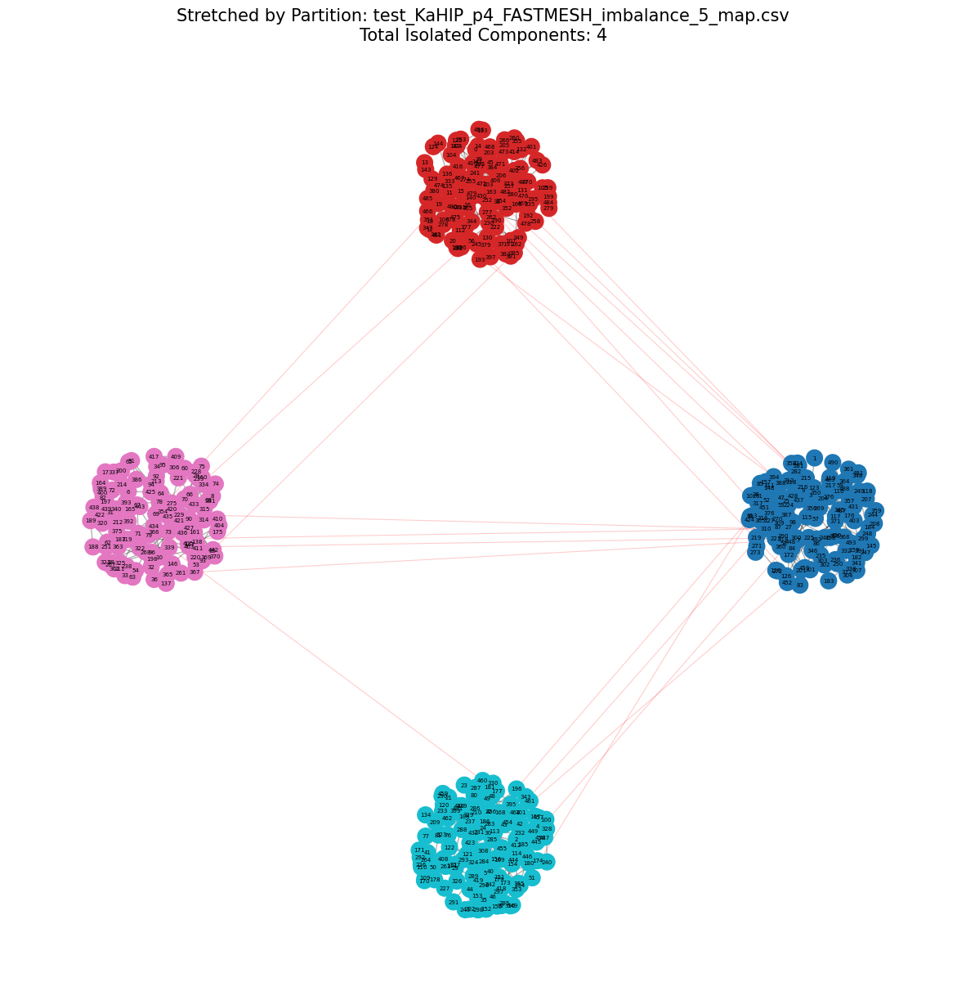


FILE: test_KaHIP_p4_ULTRAFASTMESH_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 2              
Total Isolated Components: 5


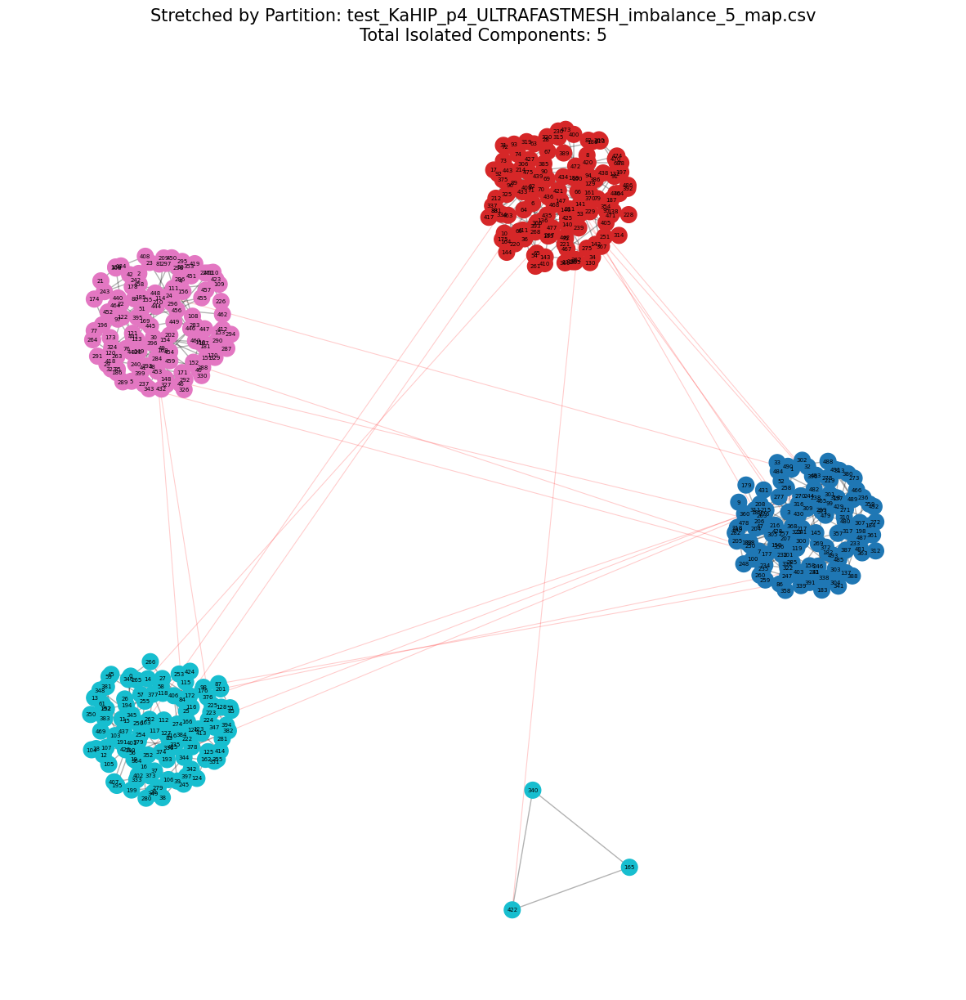


FILE: test_KaMinPar_p4_create_default_context_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 4


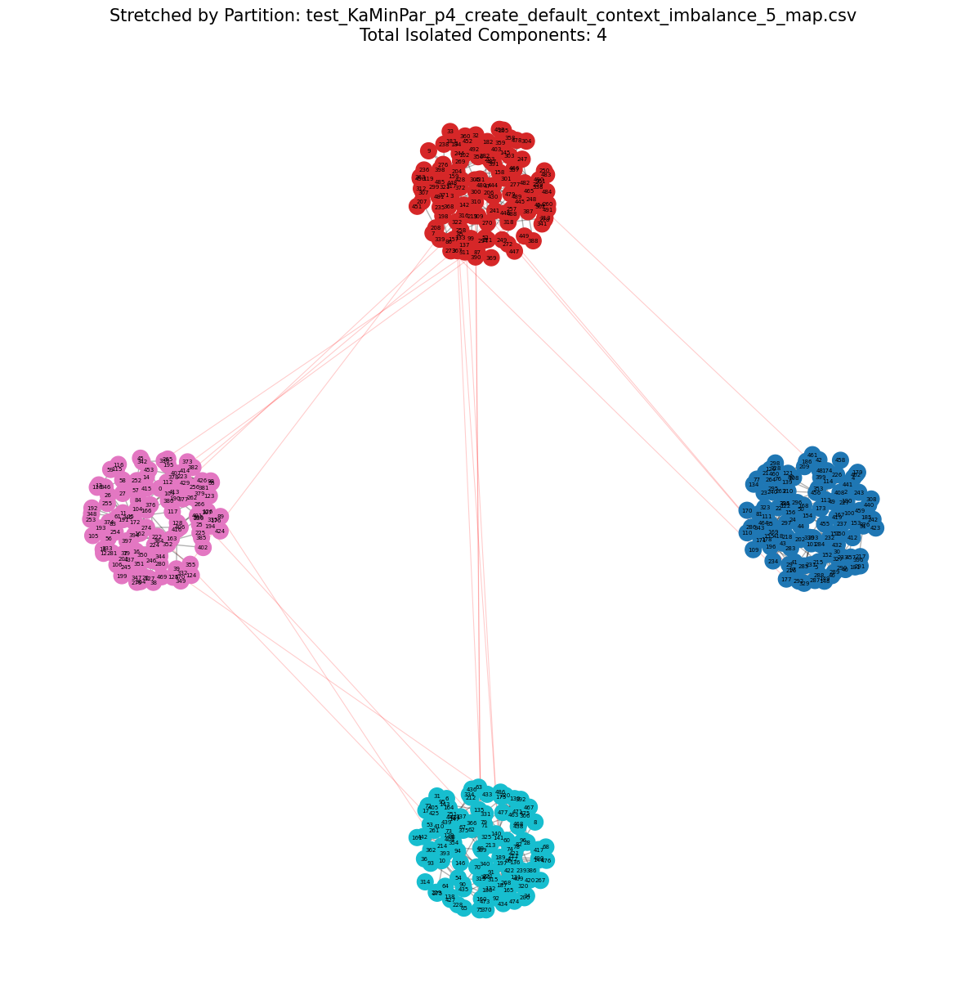


FILE: test_KaMinPar_p4_create_strong_context_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 4


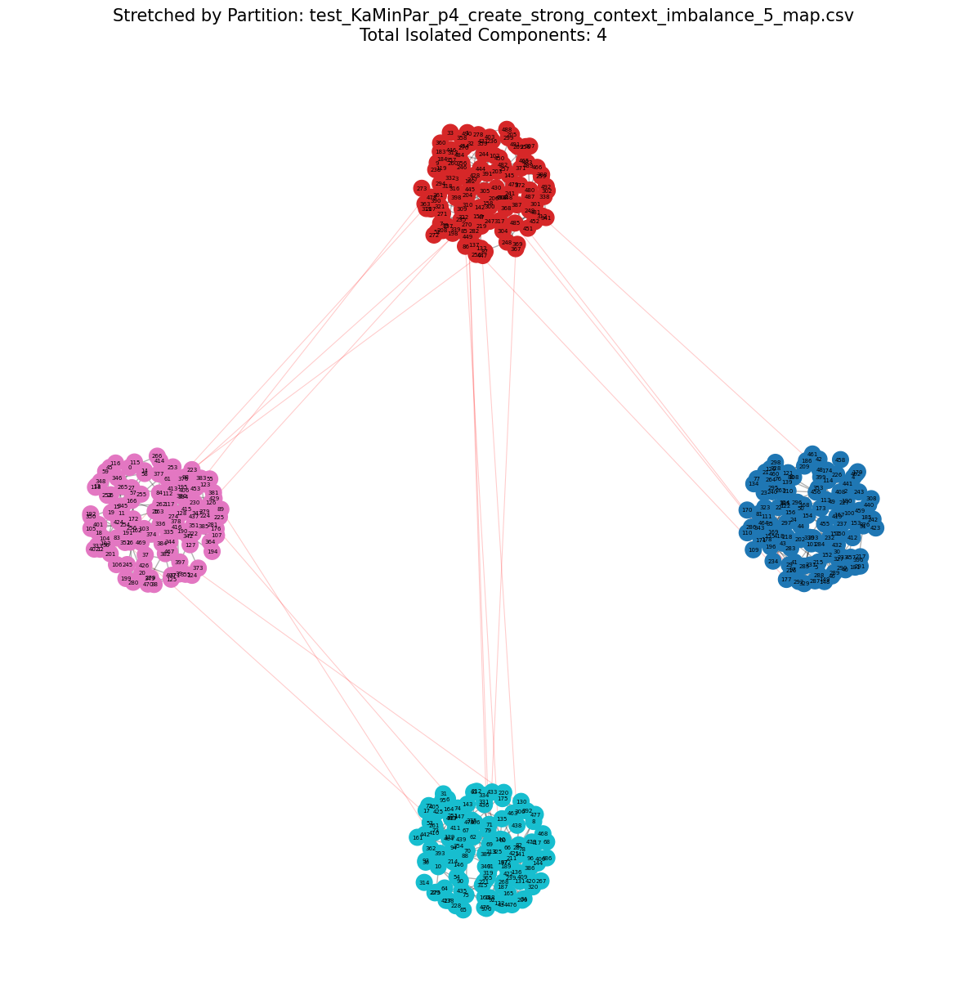


FILE: test_ParMETIS_p4_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 2              
Total Isolated Components: 5


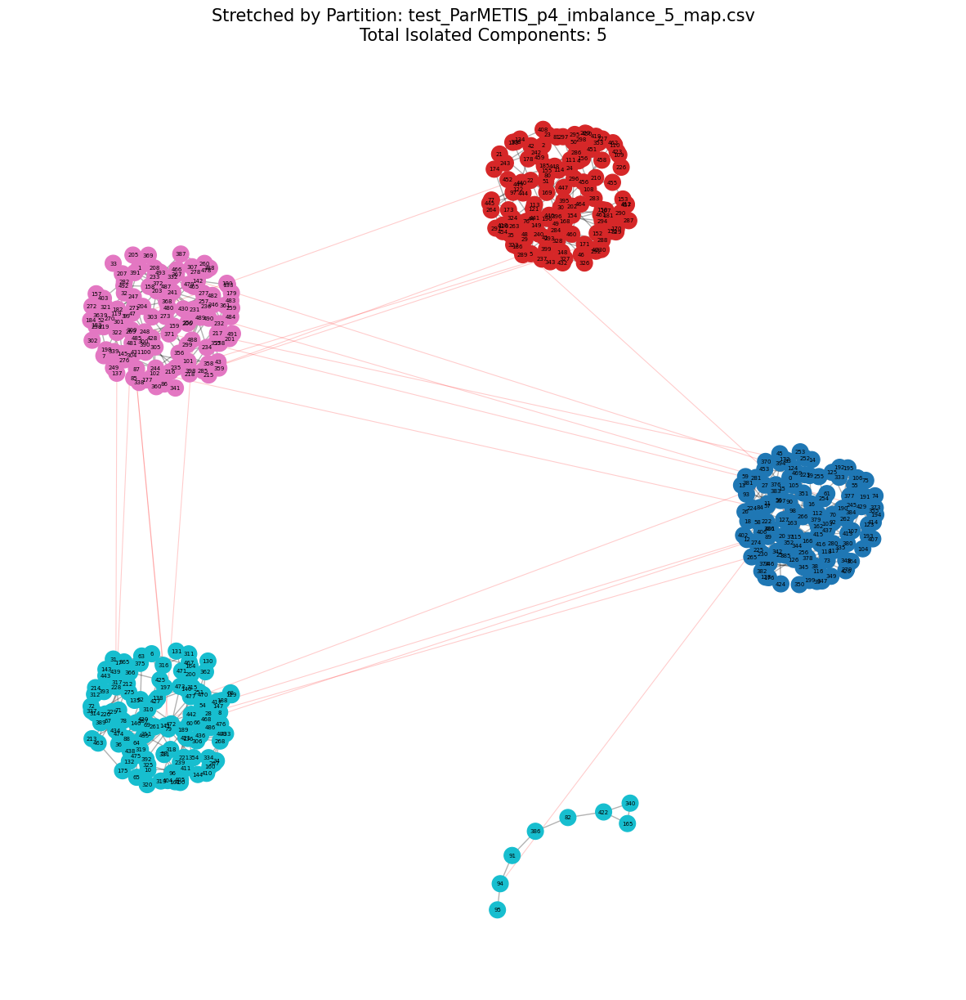


FILE: test_SCOTCH_p4_SCOTCH_STRATBALANCE_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 2              
3               | 1              
Total Isolated Components: 5


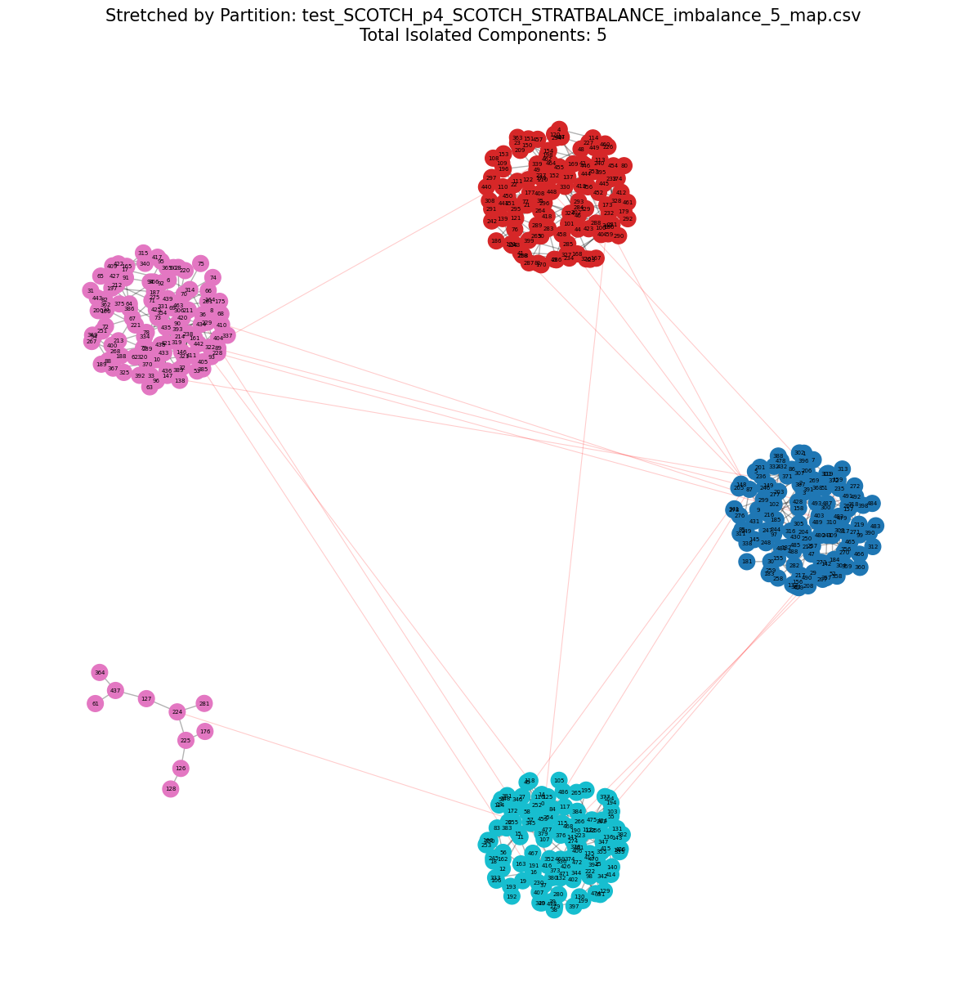


FILE: test_SCOTCH_p4_SCOTCH_STRATQUALITY_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 7


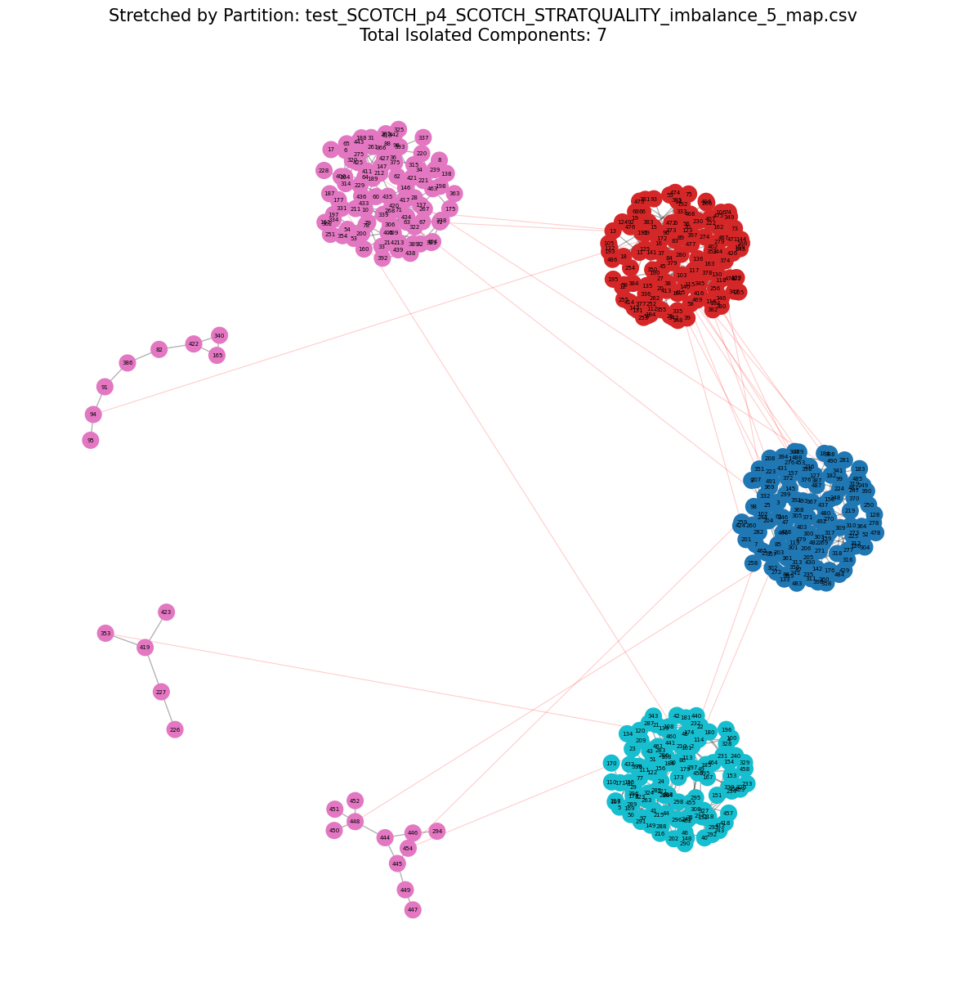


FILE: test_SCOTCH_p4_SCOTCH_STRATSPEED_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 2              
3               | 1              
Total Isolated Components: 5


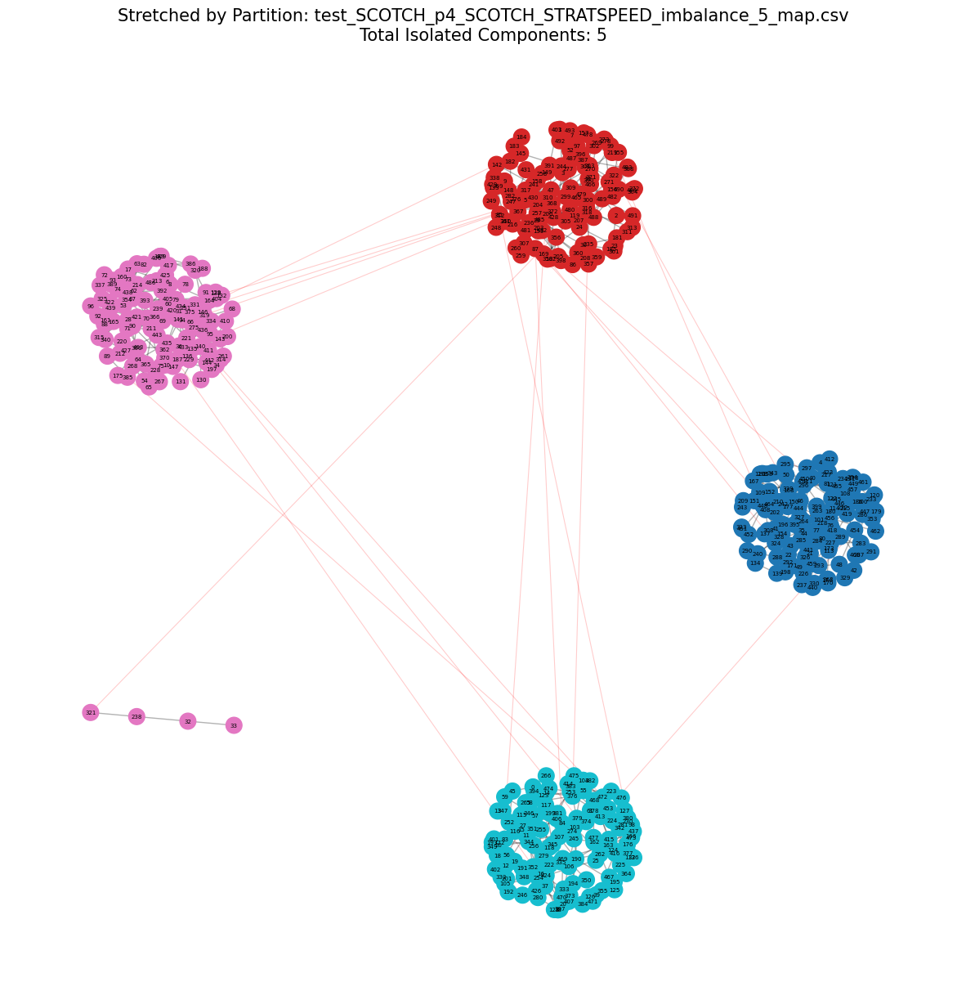


FILE: test_Zoltan2_Sphynx_p4_combinatorial_jacobi_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 3              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 9


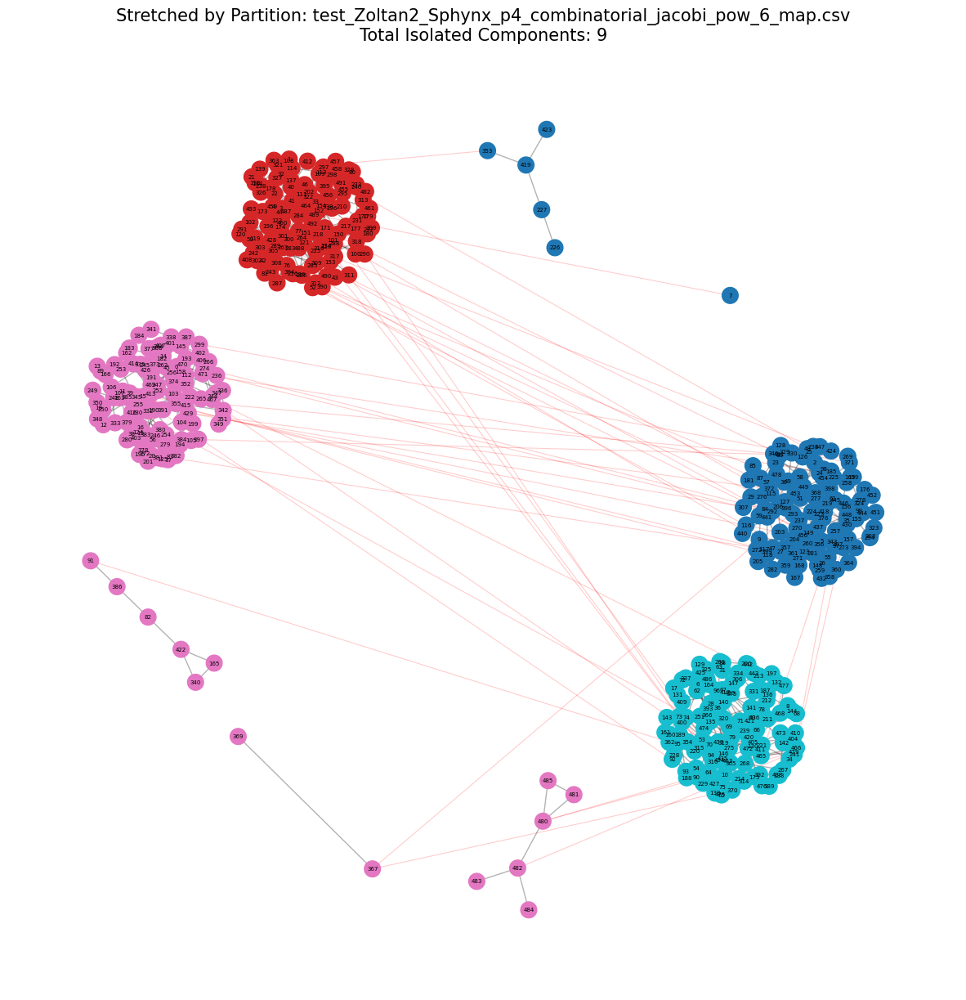


FILE: test_Zoltan2_Sphynx_p4_combinatorial_muelu_pow_4_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 3              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 9


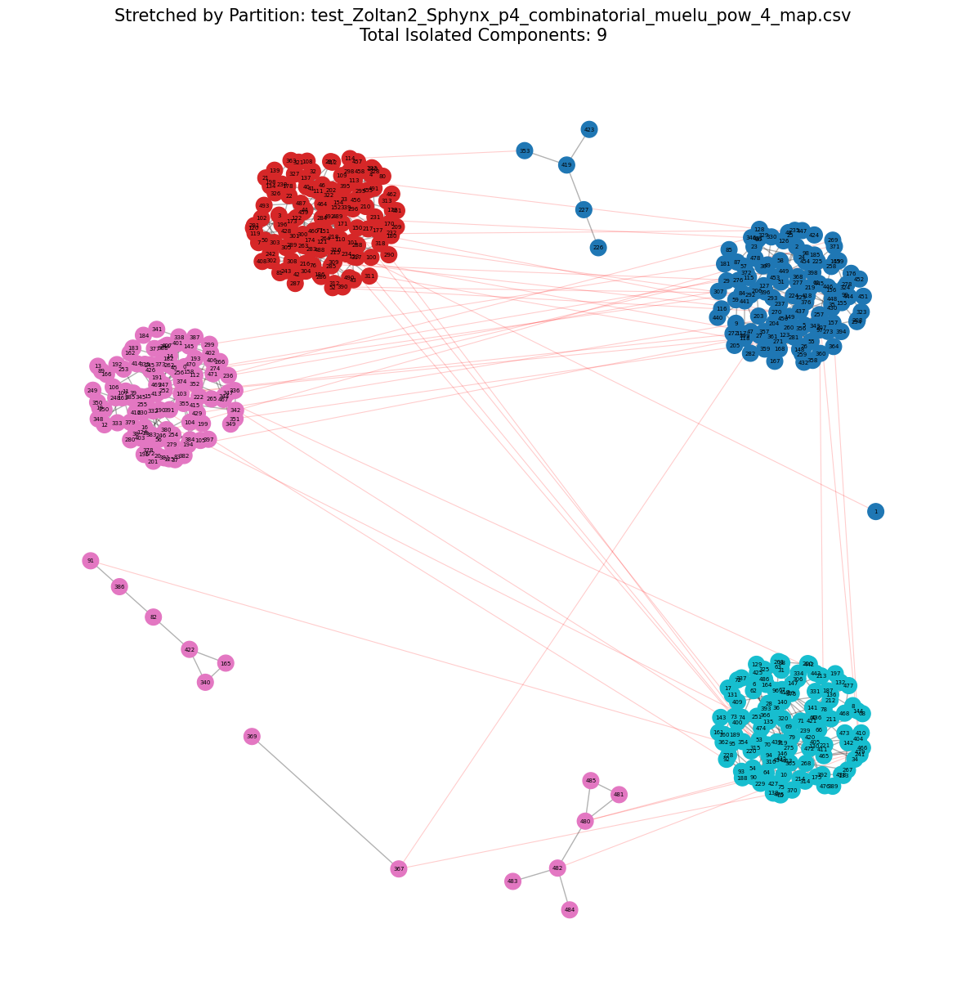


FILE: test_Zoltan2_Sphynx_p4_combinatorial_muelu_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 3              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 9


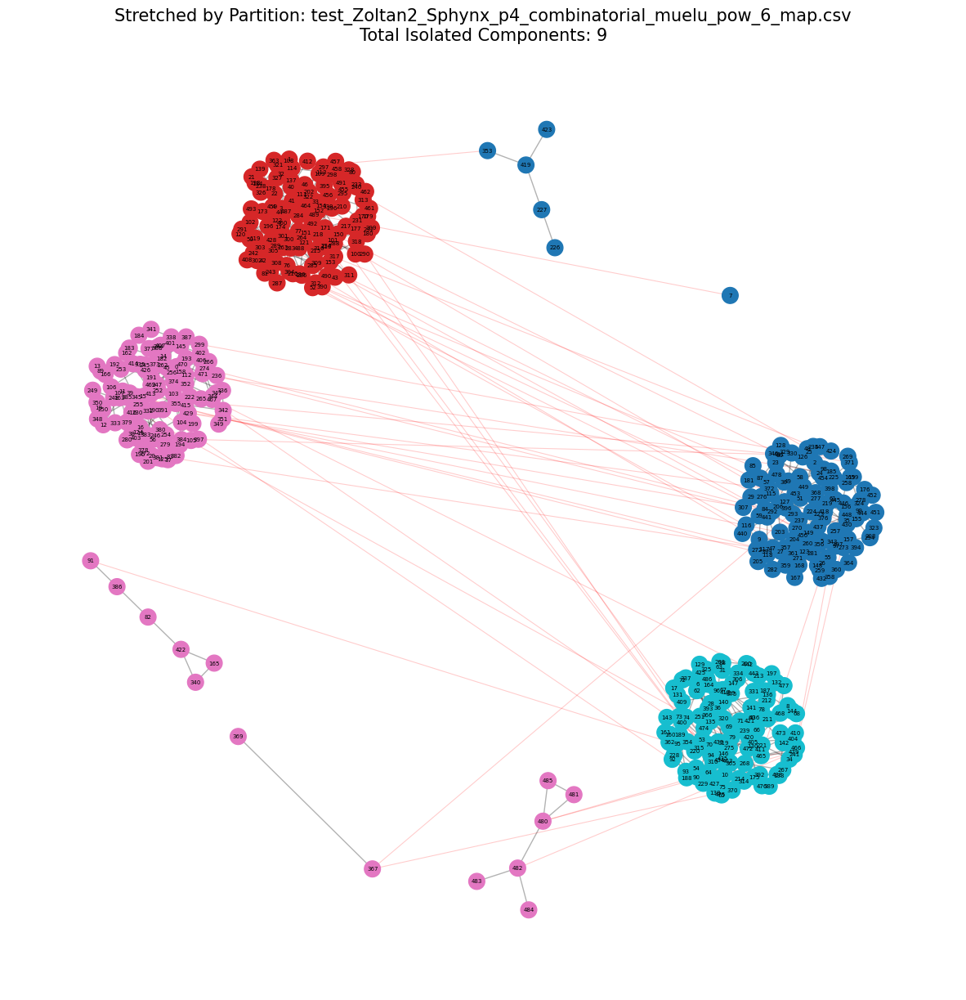


FILE: test_Zoltan2_Sphynx_p4_combinatorial_muelu_pow_8_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 2              
2               | 1              
3               | 5              
Total Isolated Components: 9


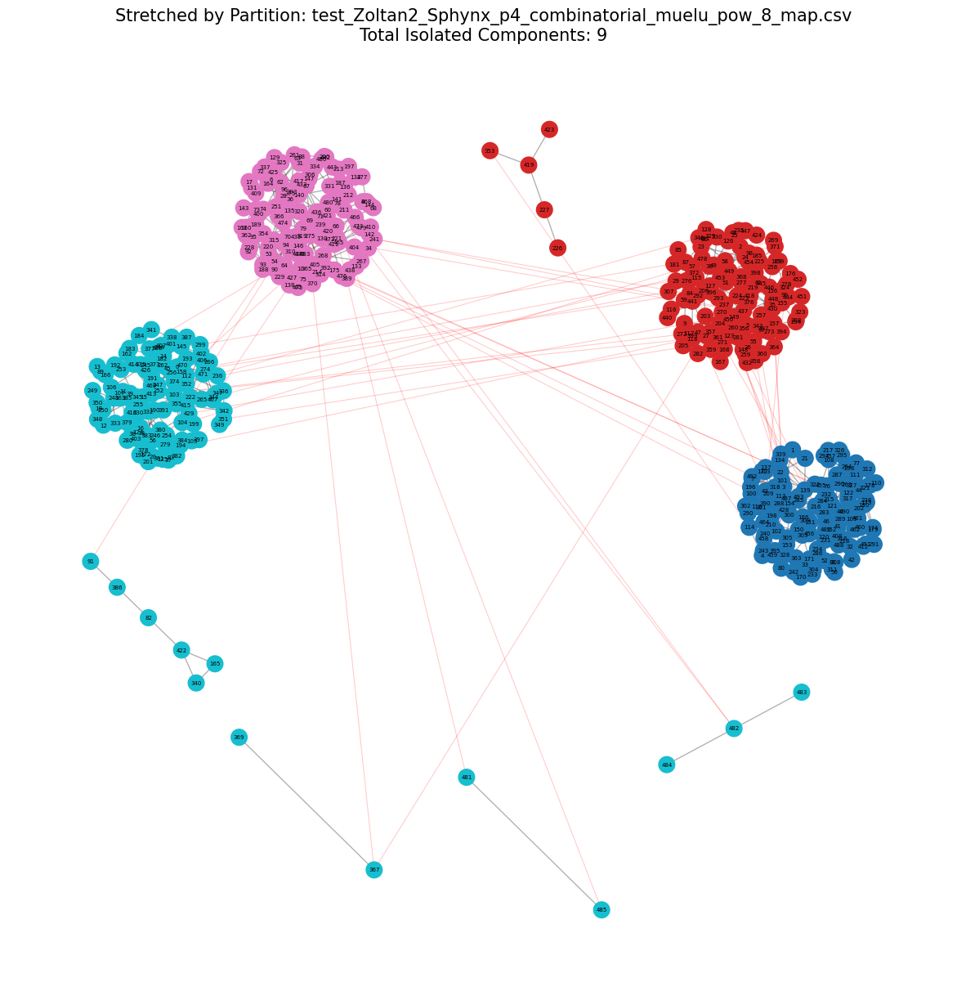


FILE: test_Zoltan2_Sphynx_p4_combinatorial_polynomial_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 5              
2               | 1              
3               | 2              
Total Isolated Components: 9


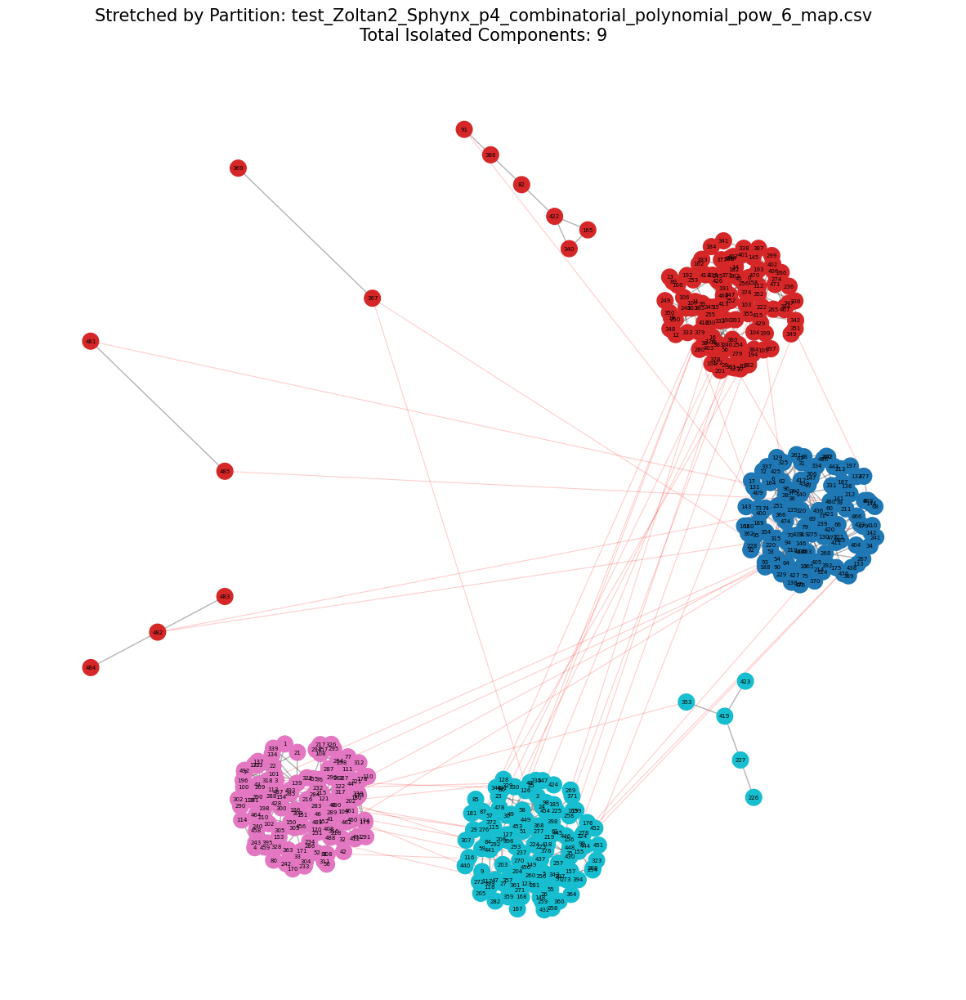


FILE: test_Zoltan2_Sphynx_p4_generalized_muelu_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 2              
2               | 2              
3               | 8              
Total Isolated Components: 13


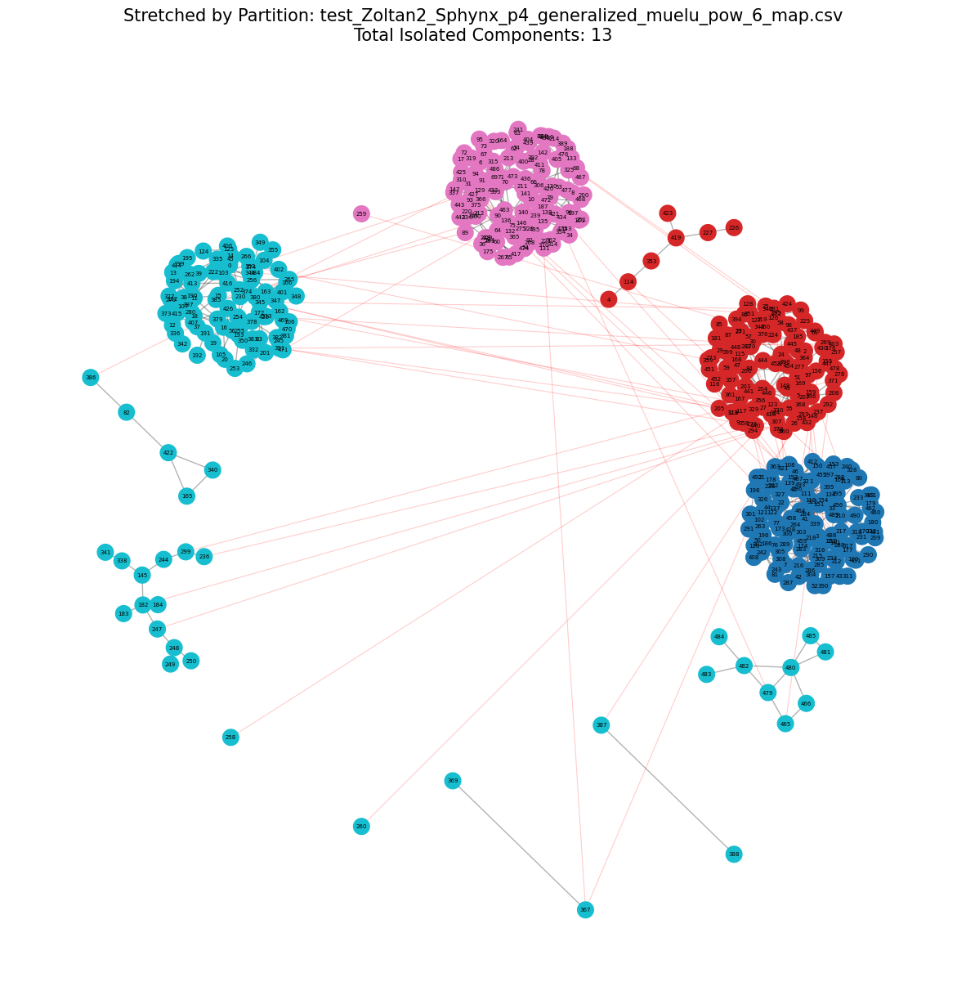


FILE: test_Zoltan2_Sphynx_p4_normalized_muelu_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 11             
1               | 5              
2               | 21             
3               | 44             
Total Isolated Components: 81


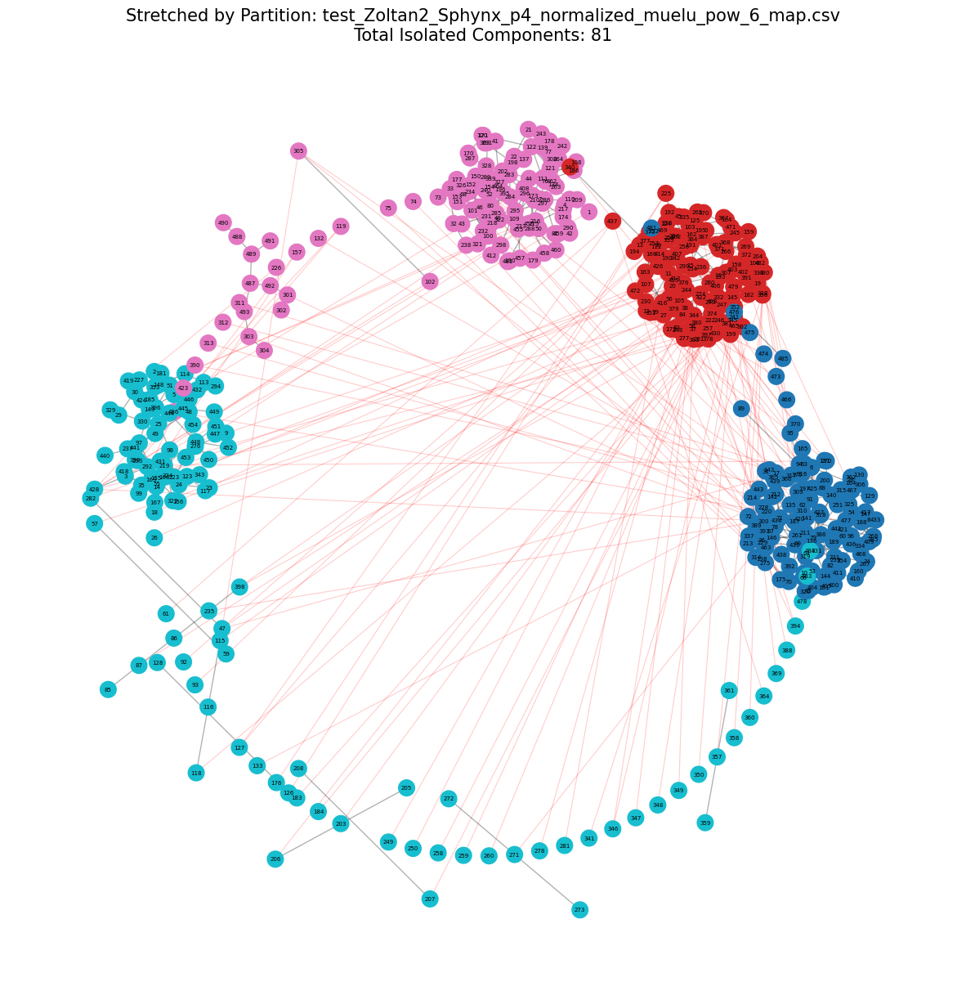


FILE: test_Zoltan_PHG_p4_phg_strat_name_default_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 2              
1               | 2              
2               | 1              
3               | 1              
Total Isolated Components: 6


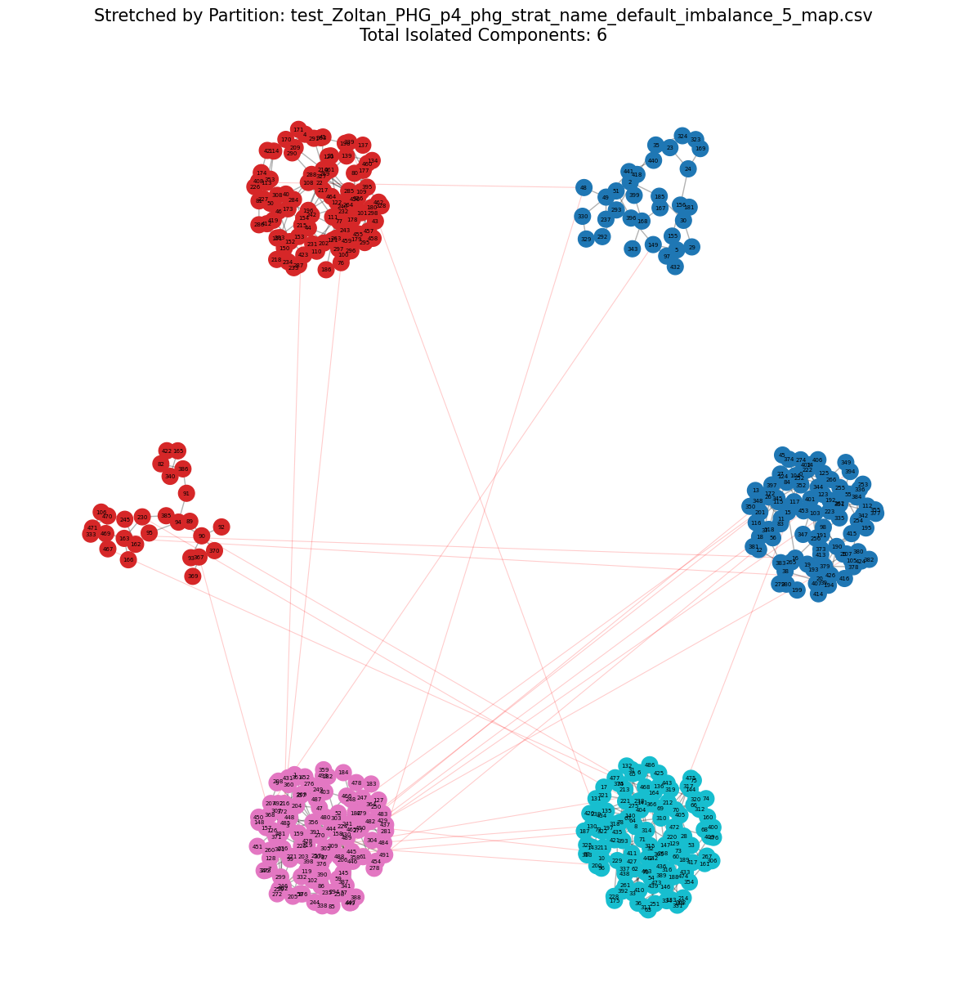


FILE: test_Zoltan_PHG_p4_phg_strat_name_strong_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 5              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 8


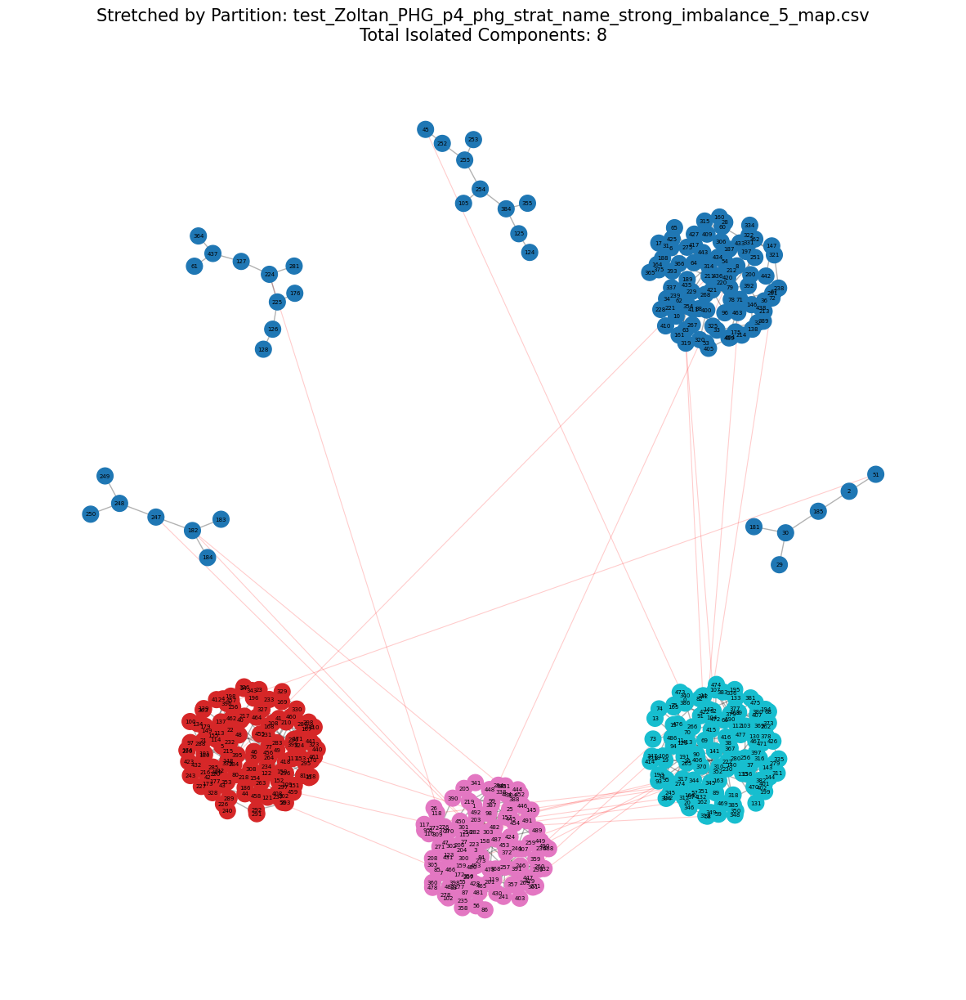

In [3]:
# Запуск
visualize_stretched_by_partition('Partitions_viz')


FILE: test_KaHIP_p4_FASTMESH_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 4


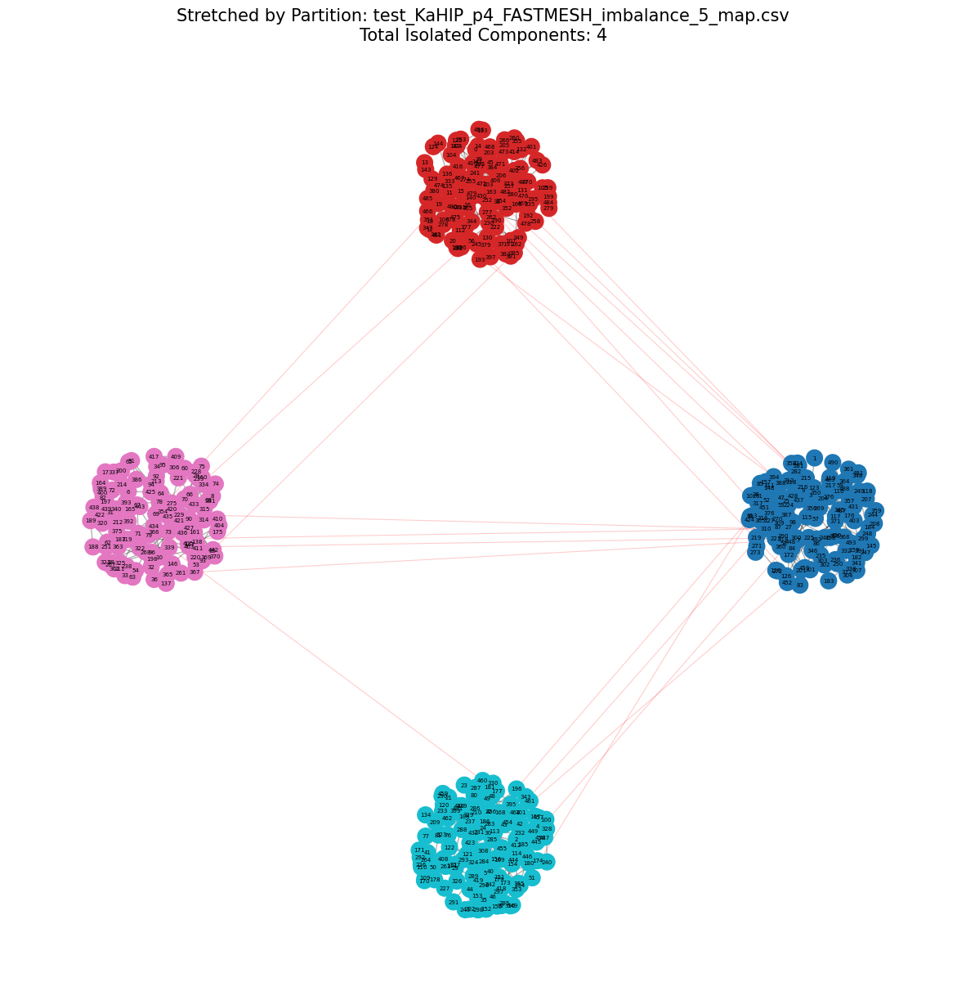


FILE: test_KaHIP_p4_ULTRAFASTMESH_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 2              
Total Isolated Components: 5


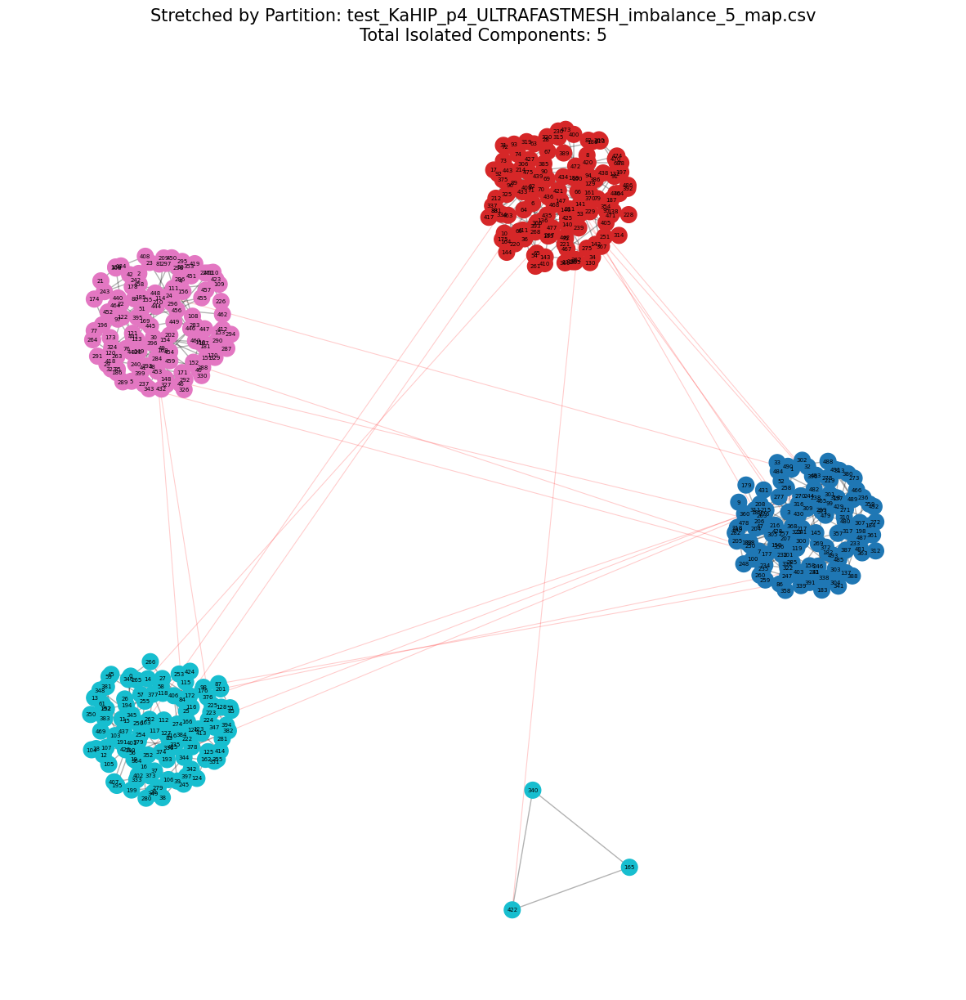


FILE: test_KaMinPar_p4_create_default_context_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 4


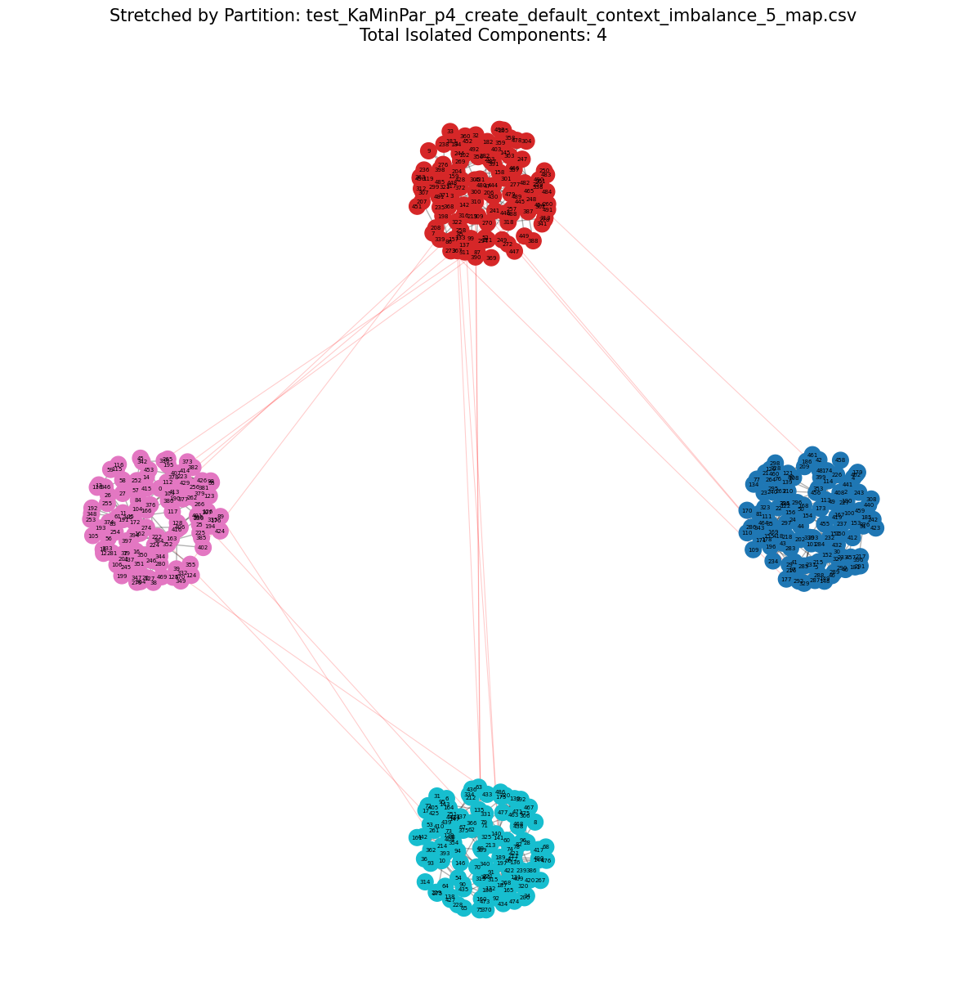


FILE: test_KaMinPar_p4_create_strong_context_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 4


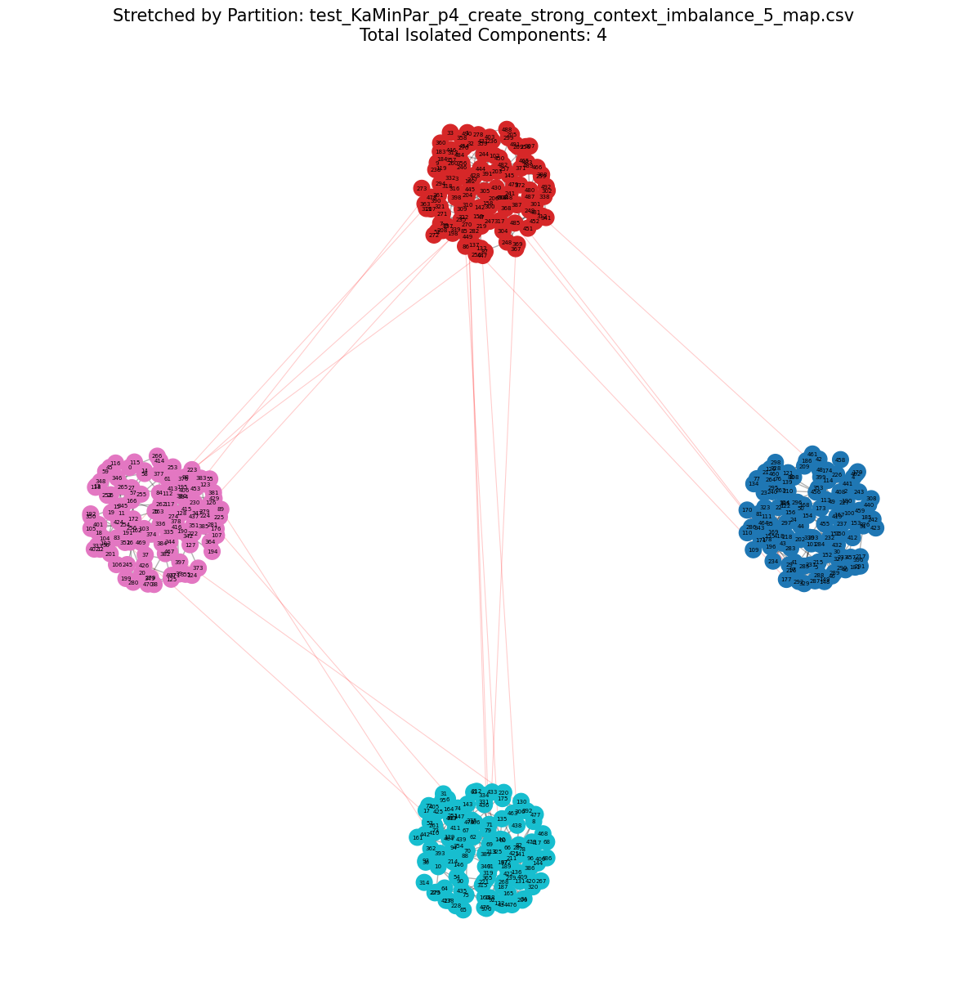


FILE: test_ParMETIS_p4_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 1              
3               | 2              
Total Isolated Components: 5


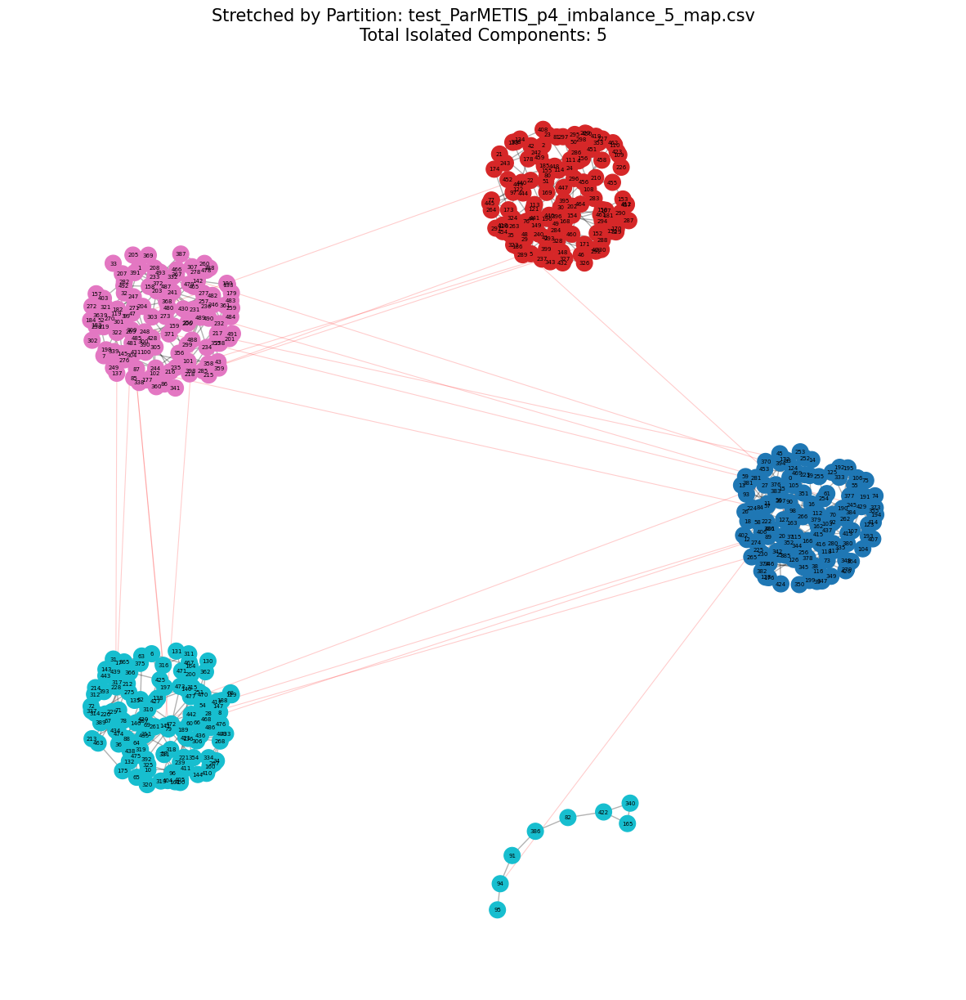


FILE: test_SCOTCH_p4_SCOTCH_STRATBALANCE_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 2              
3               | 1              
Total Isolated Components: 5


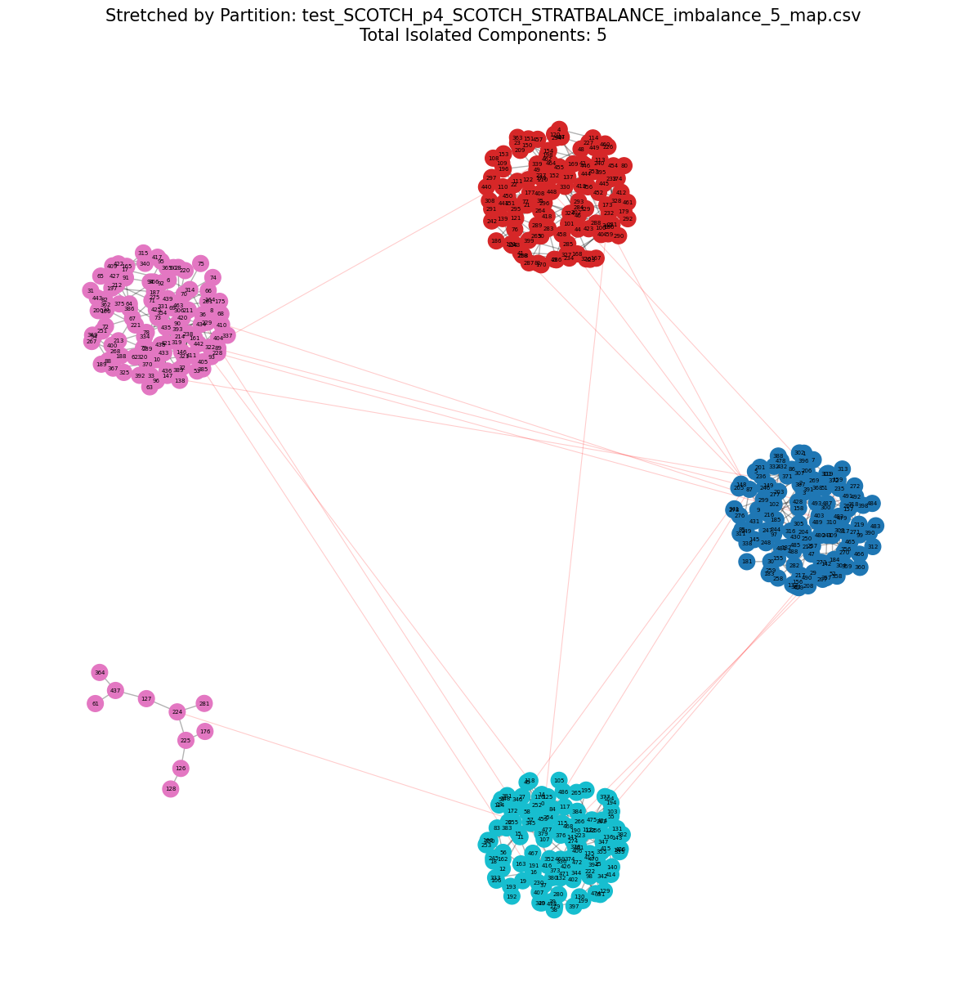


FILE: test_SCOTCH_p4_SCOTCH_STRATQUALITY_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 7


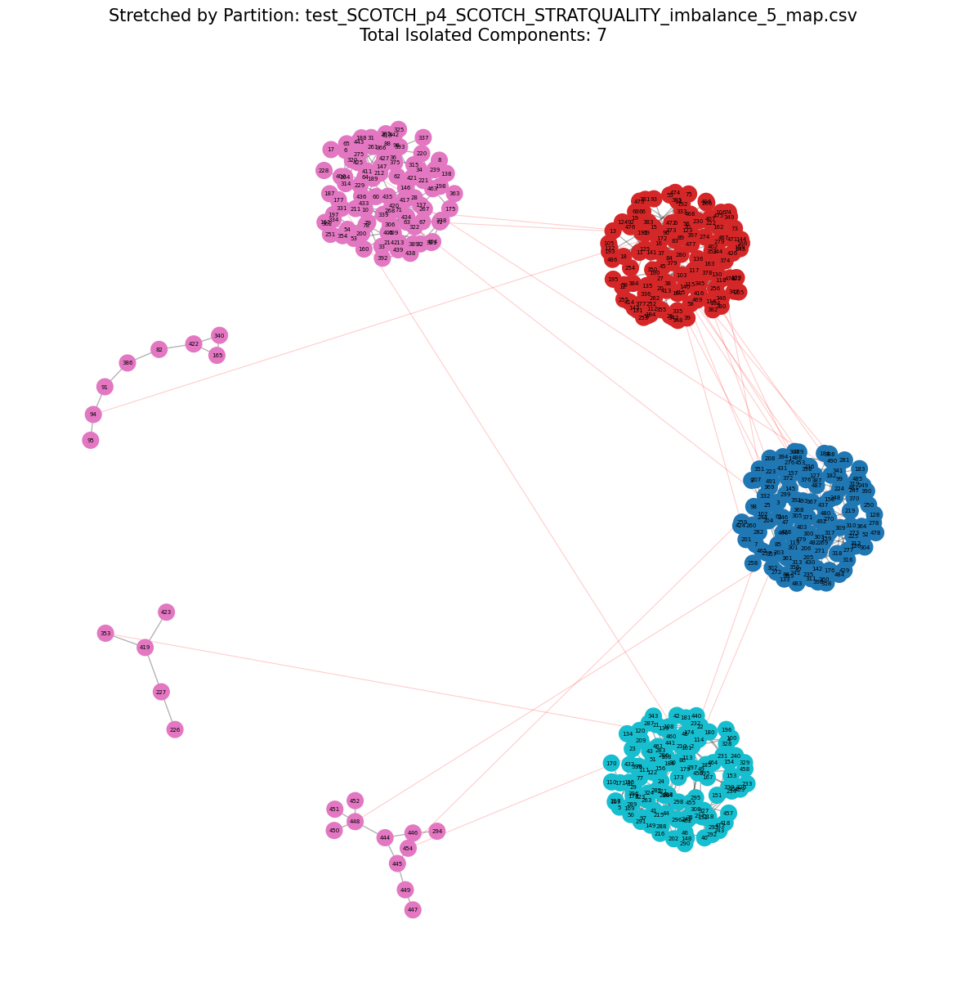


FILE: test_SCOTCH_p4_SCOTCH_STRATSPEED_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 1              
2               | 2              
3               | 1              
Total Isolated Components: 5


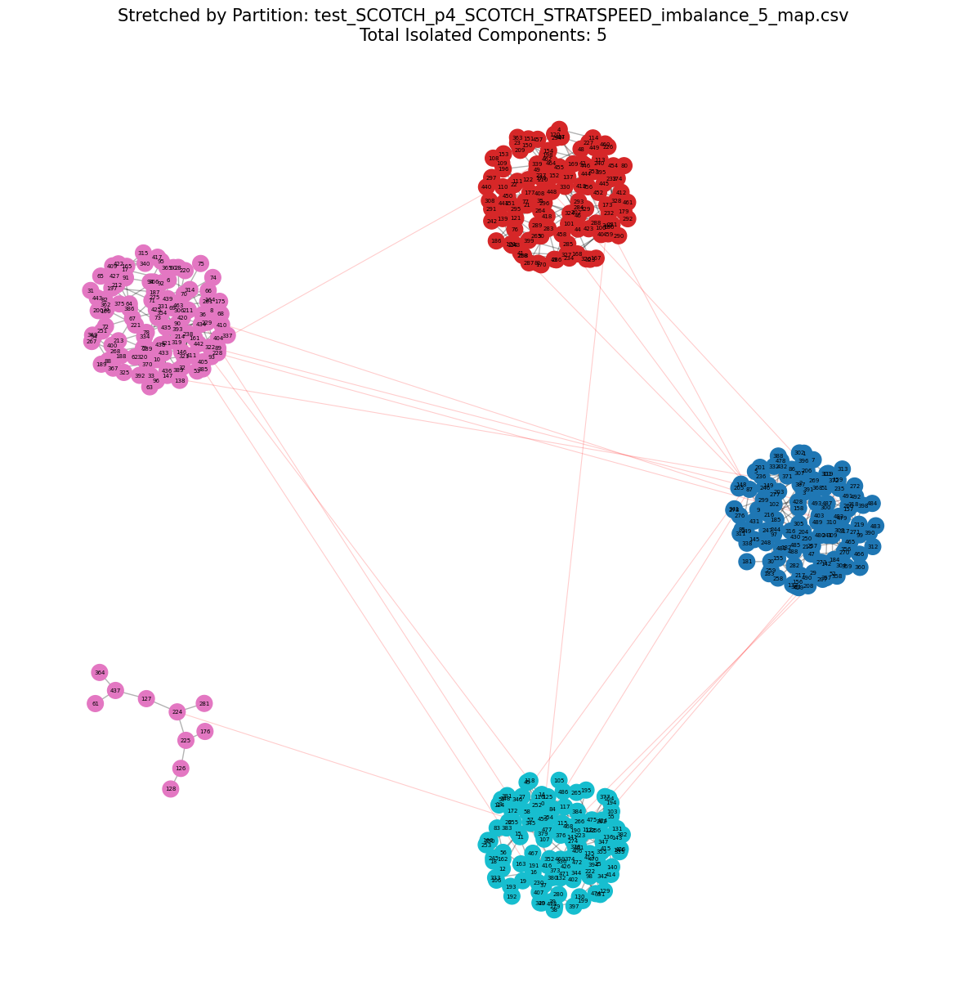


FILE: test_Zoltan2_Sphynx_p4_combinatorial_jacobi_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 3              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 9


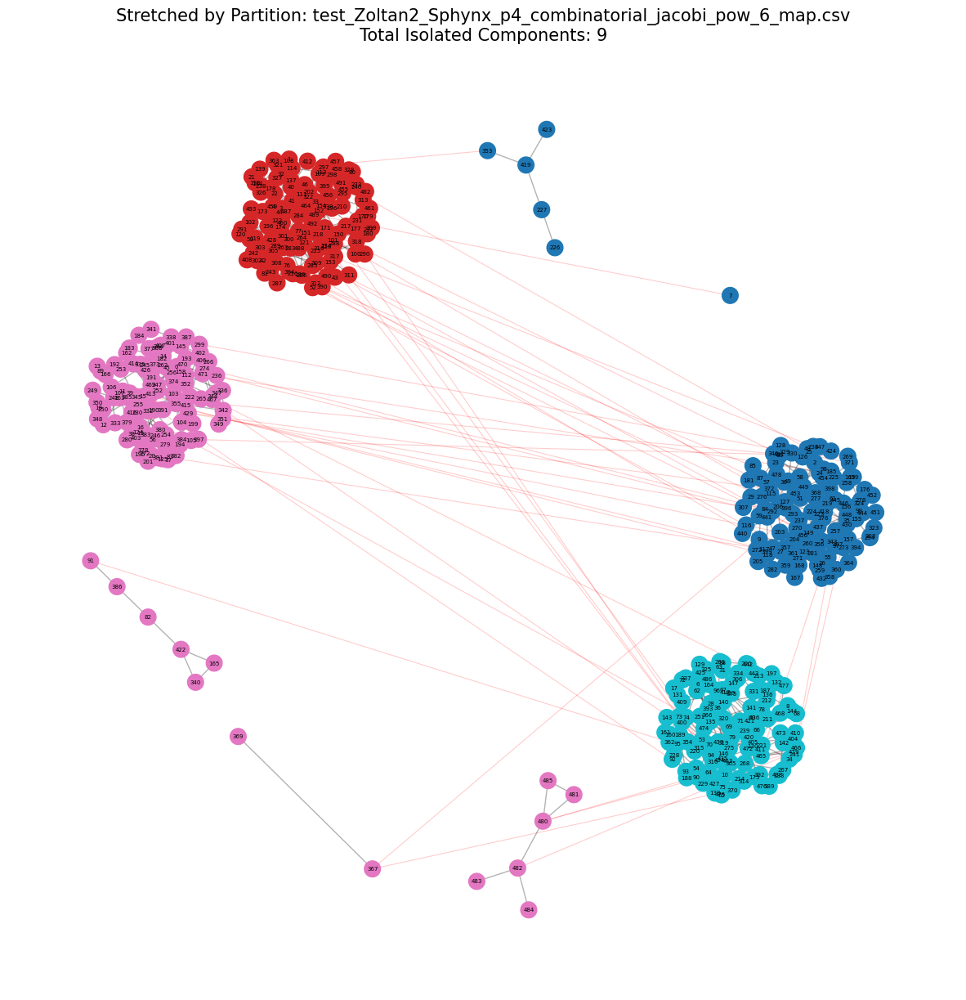


FILE: test_Zoltan2_Sphynx_p4_combinatorial_muelu_pow_4_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 3              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 9


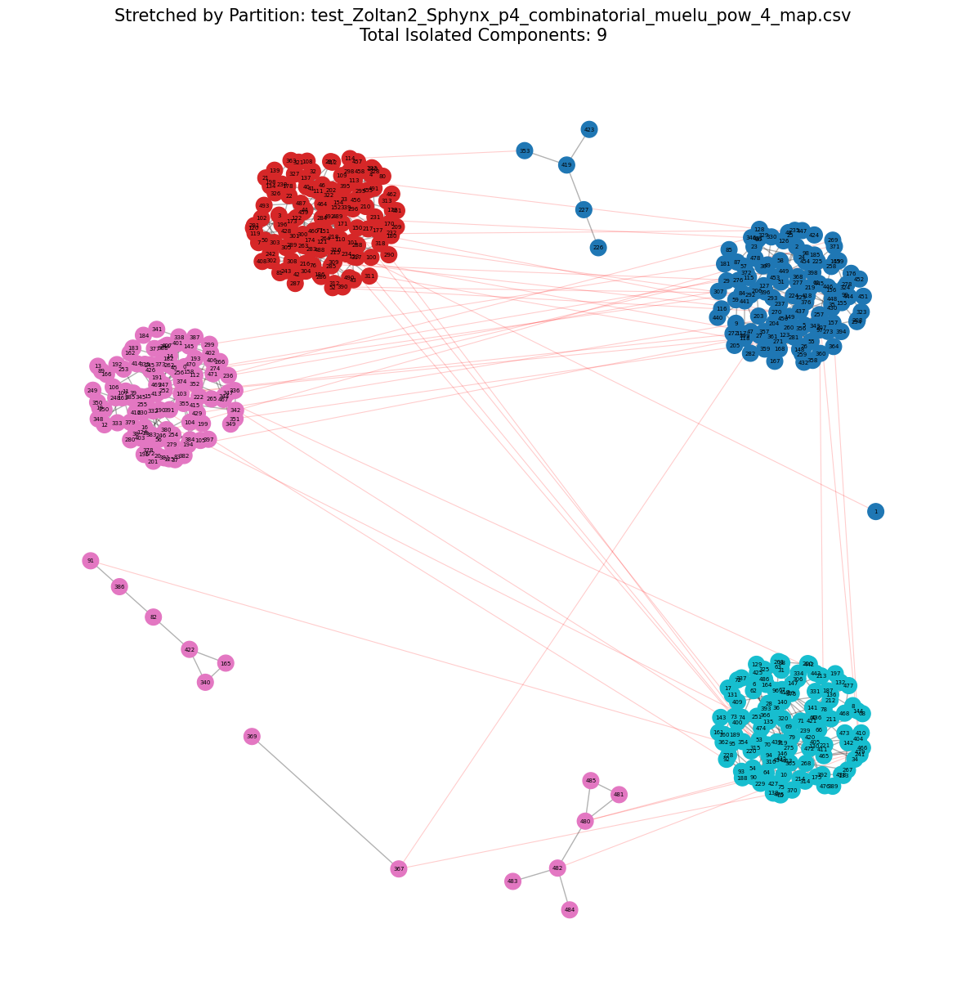


FILE: test_Zoltan2_Sphynx_p4_combinatorial_muelu_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 3              
1               | 1              
2               | 4              
3               | 1              
Total Isolated Components: 9


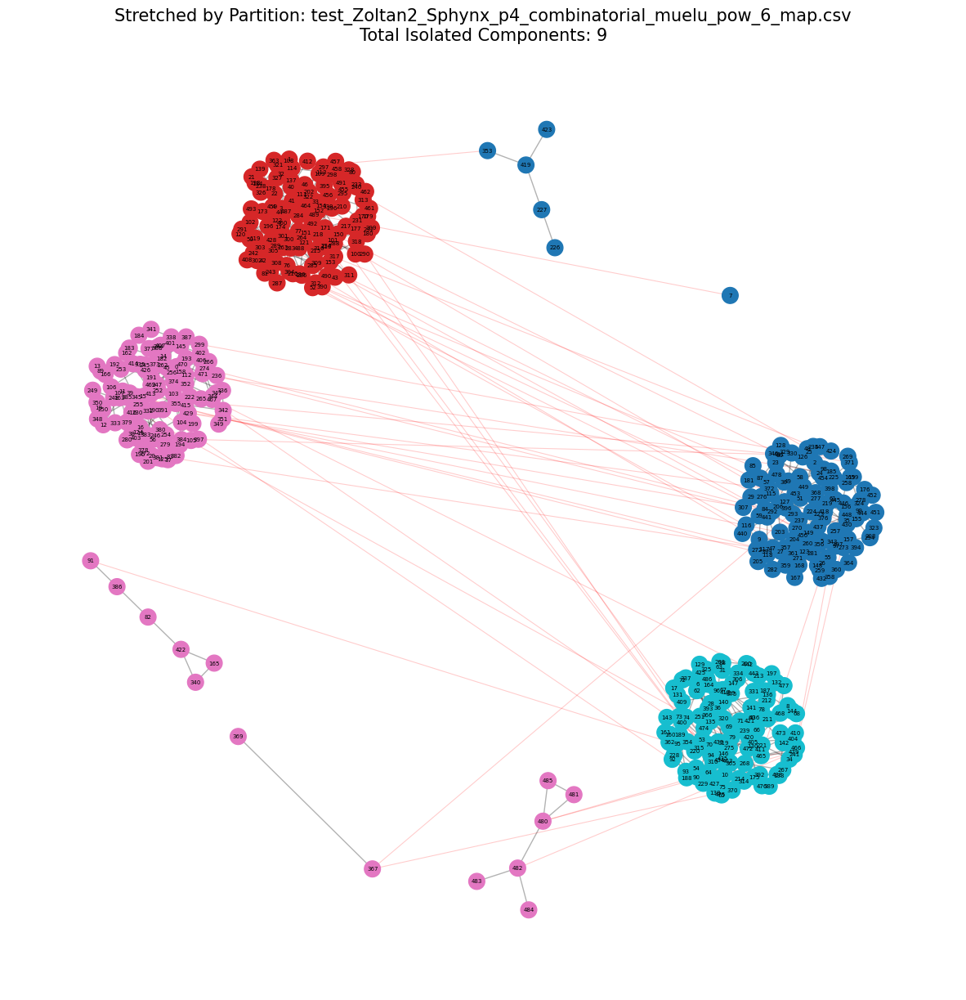


FILE: test_Zoltan2_Sphynx_p4_combinatorial_muelu_pow_8_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 2              
2               | 1              
3               | 5              
Total Isolated Components: 9


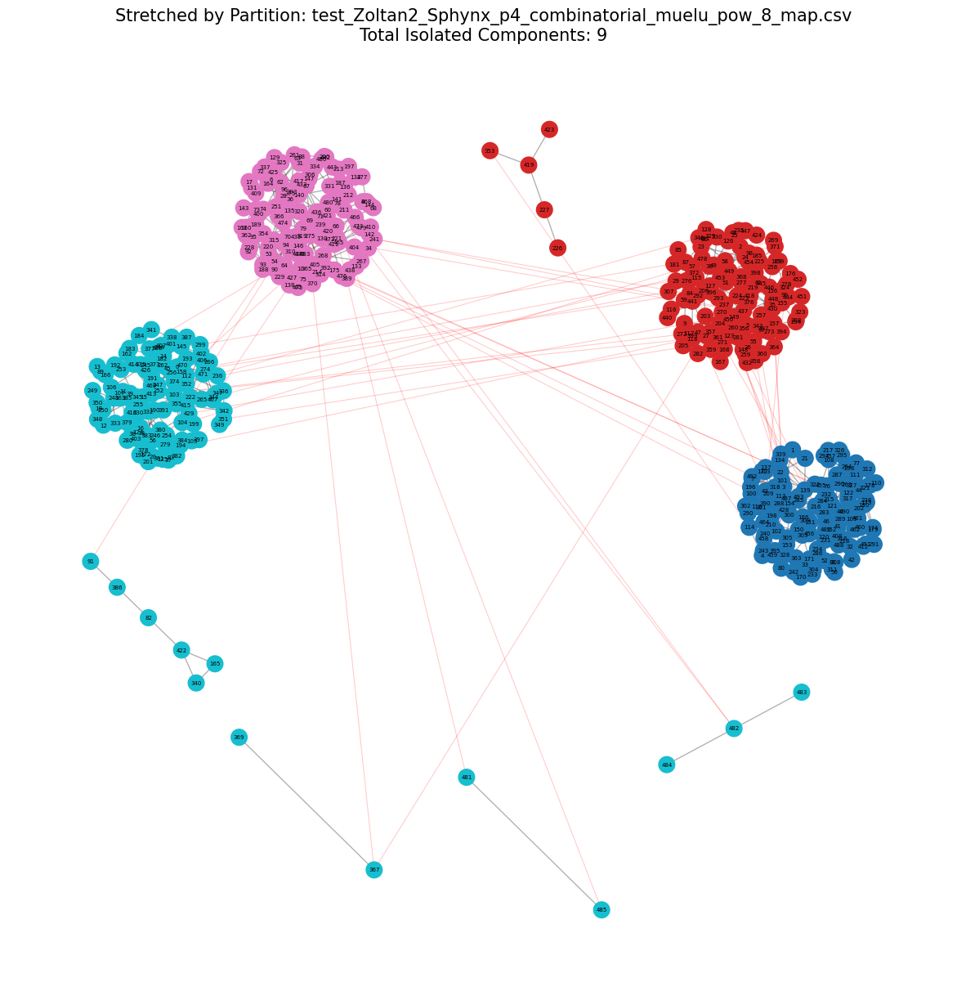


FILE: test_Zoltan2_Sphynx_p4_combinatorial_polynomial_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 5              
2               | 1              
3               | 2              
Total Isolated Components: 9


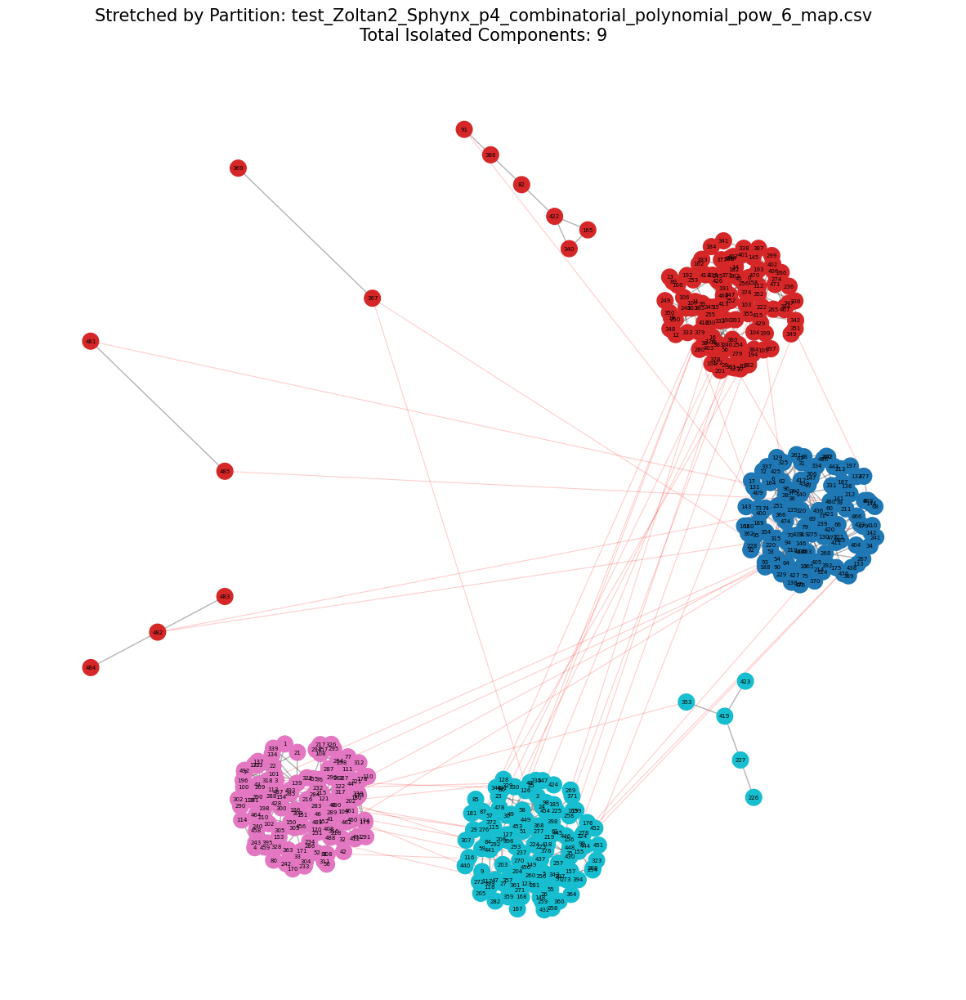


FILE: test_Zoltan2_Sphynx_p4_generalized_muelu_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 1              
1               | 2              
2               | 2              
3               | 8              
Total Isolated Components: 13


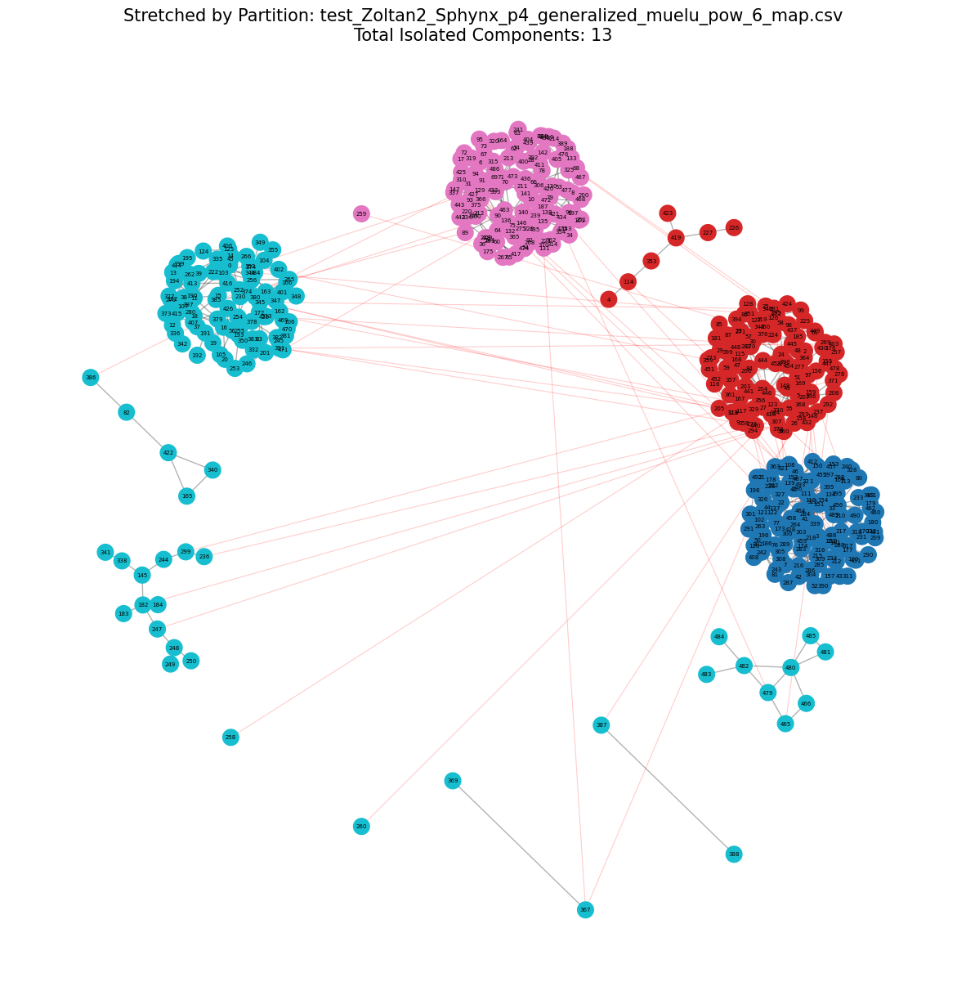


FILE: test_Zoltan2_Sphynx_p4_normalized_muelu_pow_6_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 11             
1               | 5              
2               | 21             
3               | 44             
Total Isolated Components: 81


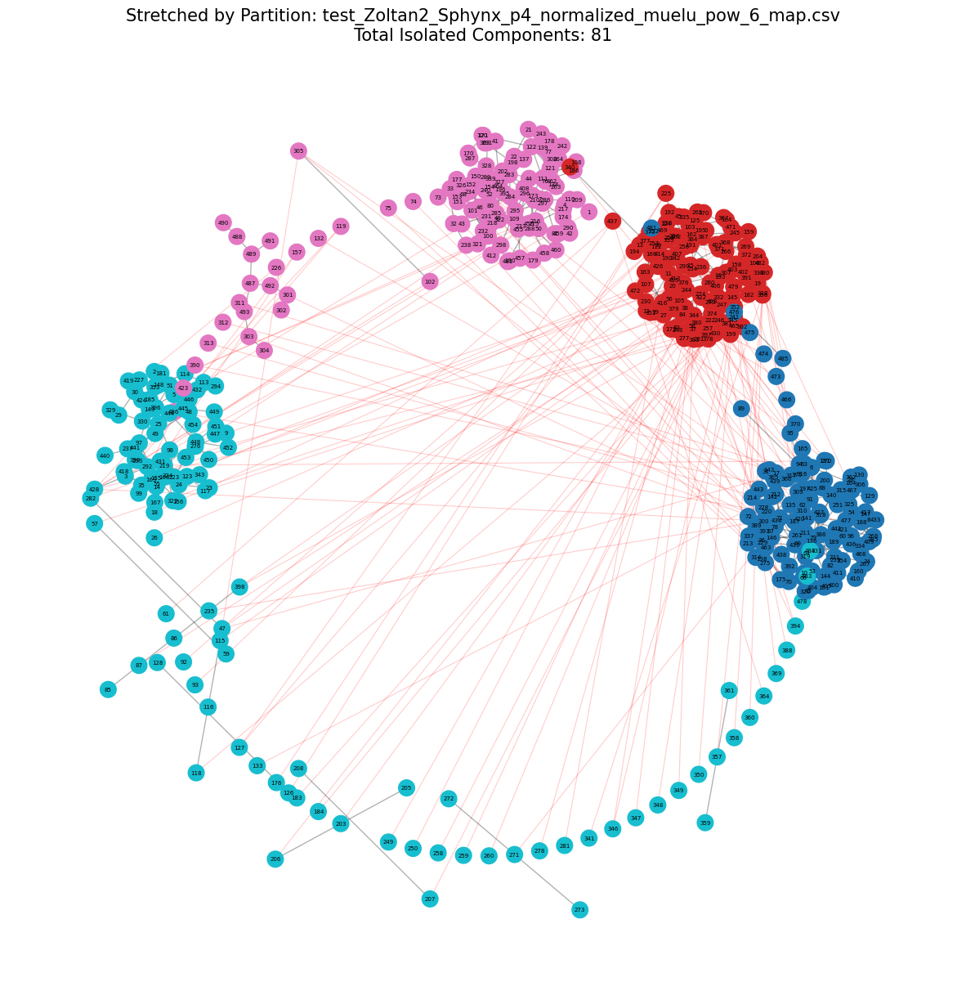


FILE: test_Zoltan_PHG_p4_phg_strat_name_default_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 2              
1               | 2              
2               | 1              
3               | 1              
Total Isolated Components: 6


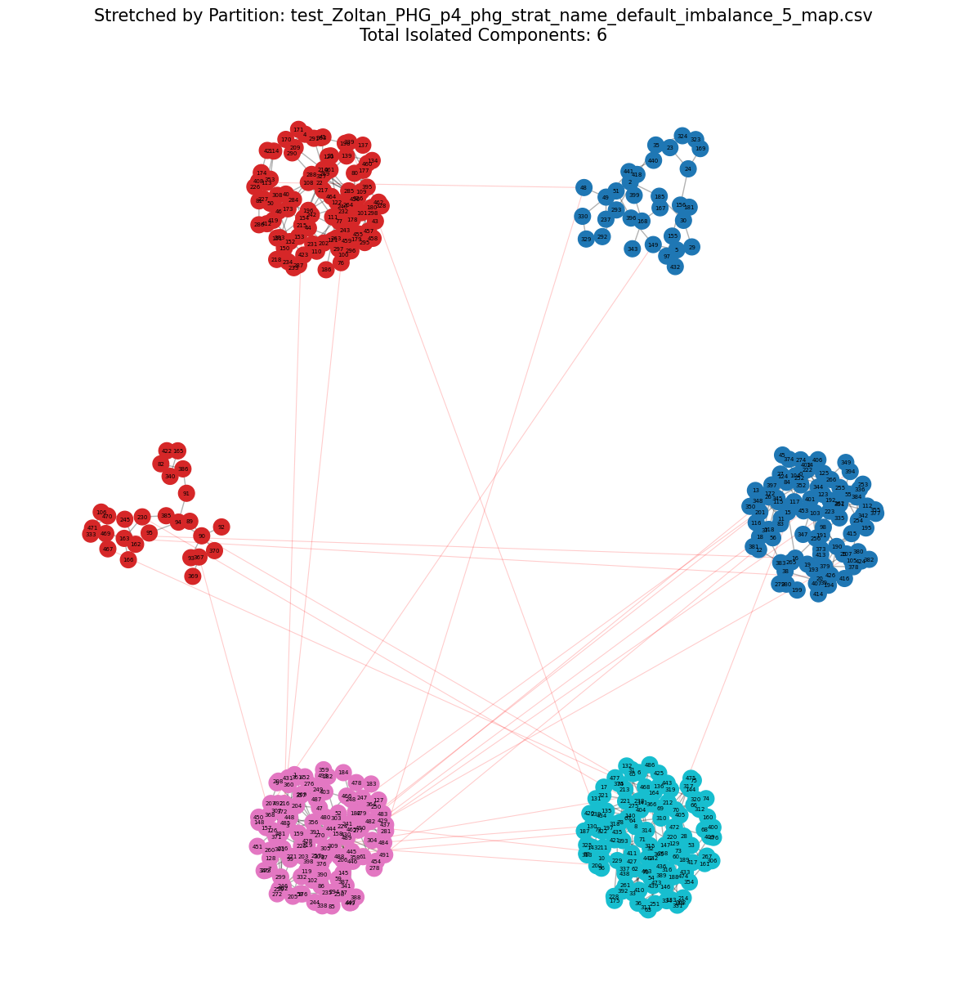


FILE: test_Zoltan_PHG_p4_phg_strat_name_strong_imbalance_5_map.csv
Partition ID    | Components Count
-----------------------------------
0               | 5              
1               | 1              
2               | 1              
3               | 1              
Total Isolated Components: 8


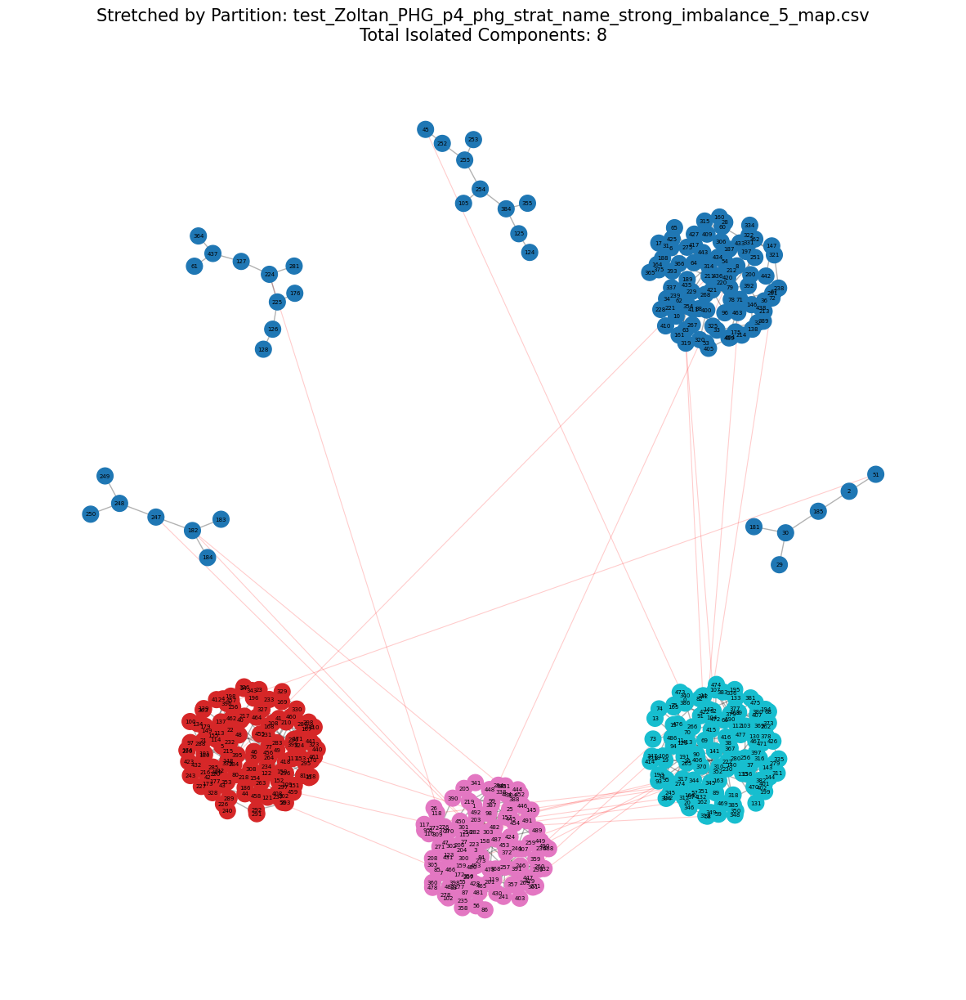

In [ ]:
# Запуск с данными от параллельной записи данных в файл
visualize_stretched_by_partition('viz2')